# QuantumSim - Simulation of Noisy Quantum Gates
Author: Tycho de Laat<br>
Date: November 13, 2024<br>

Introduction

The proposed noisy quantum gates are adapted from: 

Giovanni Di Bartolomeo, Michele Vischi, Francesco Cesa, Roman Wixinger, Michele Grossi, Sandro Donadi and Angelo Bassi<br>
Noisy gates for simulating quantum computers<br>
DOI: 10.1103/PhysRevResearch.5.043210<br>
https://journals.aps.org/prresearch/abstract/10.1103/PhysRevResearch.5.043210

In this notebook we will use QuantumSim.

In [1]:
from quantumsim import *

# Simulation of noisy quantum gates
Originally, to simulate noise in a circuit, an ideal gate was added to a circuit followed by the corrosponding noise gate. An example of the this way of simulating noise can be found below and the explenation can be found in the [QuantumSimNoise notebook](./QuantumSimNoise.ipynb).<br>

However, when using a real quantum computer, the noise occurs during the execution of gates rather than after. In an attempt to better simulate this we introduced noisy gates into QuantumSim. Further explenations and examples of these noisy gates will be given in this notebook.

## Orginal noise simulation

Here an example is given on how the original noise simulation was implemented.

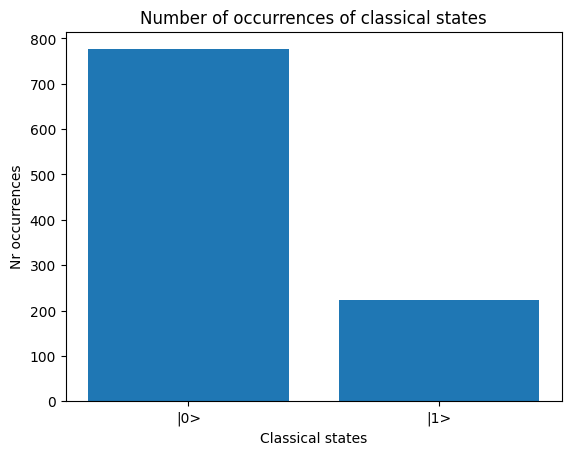

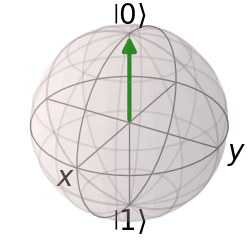

In [2]:
from IPython.display import HTML

n = 100 # Number of gate operations
circuit = NoisyCircuit(1)
for i in range(n):
    circuit.pauli_x(0)
    circuit.add_noisy_operation_coherent_x(3, 0)

result = QuantumUtil.measure_circuit(circuit, nr_measurements=1000)
QuantumUtil.histogram_of_classical_states(result)

ani_bloch_spheres = QuantumUtil.create_animation(circuit)
HTML(ani_bloch_spheres.to_jshtml())

## Noisy gate simulation

From here on out, the implementation of the noise quantum gates implementation, inspired by Di Bartolomeo et al., is shown.

### Device parameters

Beginning with the Device parameter class. This class is used to load the noise parameter values from the a json file.

In [4]:
# The following classes are adapted from `quantum-gates`:
# Source: https://pypi.org/project/quantum-gates/
# License: MIT License
# Original Authors: M. Grossi, G. D. Bartolomeo, M. Vischi, P. Da Rold, R. Wixinger

"""
Class for loading, storing, validating and passing device parameters. These parameter represent the noise level of the
device.
"""

import os
from datetime import datetime
import json
import numpy as np

class DeviceParameters(object):
    """Snapshot of the noise of the IBM backend. Can load and save the properties.

    Args:
        qubits_layout (list[int]): Layout of the qubits.

    Attributes:
        qubits_layout (list[int]): Layout of the qubits.
        nr_of_qubits (int): Number of qubits to be used.
        T1 (np.array): T1 time.
        T2 (np.array): T2 time.
        p (np.array): To be added.
        rout (np.array): To be added.
        p_int (np.array): Error probabilites in the 2 qubit gate.
        p_int (np.array): Gate time to implement controlled not operations in the 2 qubit gate.
        tm (np.array): To be added.
        dt (np.array): To be added.
        
    """

    def __init__(self):
        self.qubits_layout = None
        self.nr_of_qubits = None
        self.T1 = None
        self.T2 = None
        self.p = None
        self.rout = None
        self.p_int = None
        self.t_int = None
        self.tm = None
        self.dt = None
        self.metadata = None
        self._names = ["T1", "T2", "p", "rout", "p_int", "t_int", "tm", "dt", "metadata"]
        self._f_txt = ["T1.txt", "T2.txt", "p.txt", "rout.txt", "p_int.txt", "t_int.txt", "tm.txt", "dt.txt",
                       "metadata.json"]

    def load_from_json(self, location: str):
        """ Load device parameters from single json file at the location.
        """
        # Verify that it exists
        self._json_exists_at_location(location)

        # Load
        f = open(location)
        data_dict = json.load(f)

        # Check json keys
        if any((name not in data_dict for name in self._names)):
            raise Exception("Loading of device parameters from json not successful: At least one quantity is missing.")

        # Add lists to instance as arrays
        self.qubits_layout = np.array(data_dict["metadata"]["qubits_layout"])
        self.nr_of_qubits = data_dict["metadata"]["config"]["n_qubits"]
        self.T1 = np.array(data_dict["T1"])
        self.T2 = np.array(data_dict["T2"])
        self.p = np.array(data_dict["p"])
        self.rout = np.array(data_dict["rout"])
        self.p_int = np.array(data_dict["p_int"])
        self.t_int = np.array(data_dict["t_int"])
        self.tm = np.array(data_dict["tm"])
        self.dt = np.array(data_dict["dt"])
        self.metadata = data_dict["metadata"]

        # Verify
        if not self.is_complete():
            raise Exception("Loading of device parameters from json was not successful: Did not pass verification.")

        return

    def load_from_texts(self, location: str):
        """ Load device parameters from many text files at the location.
        """

        # Verify that exists
        self._texts_exist_at_location(location)

        # Load -> If the text has only one line, we have to make it into an 1x1 array explicitely.
        if self.nr_of_qubits == 1:
            # Here we use 'array' because with only one qubit 'loadtxt' doesn't load an array
            self.T1 = np.array([np.loadtxt(location + self.f_T1)])
            self.T2 = np.array([np.loadtxt(location + self.f_T2)])
            self.p = np.array([np.loadtxt(location + self.f_p)])
            self.rout = np.array([np.loadtxt(location + self.f_rout)])
            self.p_int = np.array([np.loadtxt(location + self.f_p_int)])
            self.t_int = np.array([np.loadtxt(location + self.f_t_int)])
            self.tm = np.array([np.loadtxt(location + self.f_tm)])
        else:
            self.T1 = np.loadtxt(location + self.f_T1)
            self.T2 = np.loadtxt(location + self.f_T2)
            self.p = np.loadtxt(location + self.f_p)
            self.rout = np.loadtxt(location + self.f_rout)
            self.p_int = np.loadtxt(location + self.f_p_int)
            self.t_int = np.loadtxt(location + self.f_t_int)
            self.tm = np.loadtxt(location + self.f_tm)
        self.dt = np.array([np.loadtxt(location + self.f_dt)])
        with open(location + self.f_metadata, "r") as metadata_file:
            self.metadata = json.load(metadata_file)

        # Verify
        if not self.is_complete():
            raise Exception("Loading of device parameters from text files was not successful: Did not pass verification.")

        return

    def get_as_tuple(self) -> tuple:
        """ Get the parameters as a tuple. The parameters have to be already loaded.
        """
        if not self.is_complete():
            raise Exception("Exception in DeviceParameters.get_as_tuble(): At least one of the parameters is None.")
        return self.T1, self.T2, self.p, self.rout, self.p_int, self.t_int, self.tm, self.dt, self.metadata

    def is_complete(self) -> bool:
        """ Returns whether all device parameters have been successfully initialized.
        """
        # Check not None
        if any((
                self.T1 is None,
                self.T2 is None,
                self.p is None,
                self.rout is None,
                self.p_int is None,
                self.t_int is None,
                self.tm is None,
                self.dt is None,
                self.metadata is None)):
            return False

        return True

    def check_T1_and_T2_times(self, do_raise_exception: bool) -> bool:
        """ Checks the T1 and T2 times. Raises an exception in case of invalid T1, T2 times if the flag is set. Returns
            whether or not all qubits are flawless.
        """

        print("Verifying the T1 and T2 times of the device: ")
        nr_bad_qubits = 0
        for i, (T1, T2) in enumerate(zip(self.T1, self.T2)):
            if T1 >= 2*T2:
                nr_bad_qubits += 1
                print('The qubit n.', self.qubits_layout[i], 'is bad.')
                print('Delete the affected qubit from qubits_layout and change the layout.')

        if nr_bad_qubits:
            print(f'Attention, there are {nr_bad_qubits} bad qubits.')
            print('In case of side effects contact Jay Gambetta.')
        else:
            print('All right!')

        if nr_bad_qubits and do_raise_exception:
            raise Exception(f'Stop simulation: The DeviceParameters class found {nr_bad_qubits} bad qubits.')

        return nr_bad_qubits == 0

    def _texts_exist_at_location(self, location):
        """ Checks if the text files with the device parameters exist at the expected location. Raises an exception
            if more than one text is missing.
        """
        missing = [f for f in self._f_txt if not os.path.exists(location + f)]
        if len(missing) > 0:
            raise FileNotFoundError(
                f"DeviceParameter found that at {location} the files {missing} are missing."
            )
        return

    def _json_exists_at_location(self, location):
        """ Checks if the json files with the device parameters exist, otherwise raises an exception.
        """
        if not os.path.exists(location):
            raise FileNotFoundError(
                f"DeviceParameter found that at {location} the file is missing."
            )
        return

    def __dict__(self):
        """ Get dict representation. """
        return {
            "T1": self.T1,
            "T2": self.T2,
            "p": self.p,
            "rout": self.rout,
            "p_int": self.p_int,
            "t_int": self.t_int,
            "tm": self.tm,
            "dt": self.dt,
            "metadata": self.metadata
        }

    def __str__(self):
        """ Representation as str. """
        return json.dumps(self.__dict__(), indent=4, default=default_serializer)

    def __eq__(self, other):
        """ Allows us to compare instances. """
        return self.__str__() == other.__str__()


def default_serializer(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    return str(obj)

### Pulse classes and integrator class

Below, the pulse classes and integrator class is defined. Unfortunately, due to time constraints, the functionality of these classes has not been researched yet.

In [5]:
# The following classes are adapted from `quantum-gates`:
# Source: https://pypi.org/project/quantum-gates/
# License: MIT License
# Original Authors: M. Grossi, G. D. Bartolomeo, M. Vischi, P. Da Rold, R. Wixinger

import numpy as np
import scipy.integrate
import scipy.stats

"""Define pulse shapes and their parametrizations.

Attributes:
    constant_pulse (ConstantPulse): Pulse of constant height which uses an analytical lookup in the integrator.
    constant_pulse_numerical (ConstantPulseNumerical): Pulse of constant height which uses numerical integration.
    gaussian_pulse (GaussianPulse): Gaussian pulse with location = 0.5 and scale = 0.25.

Todo:
    * Add parametrized pulses based on Power Series or Fourier Series.
"""
class Pulse(object): # TODO - Research the functionality of this class
    """ Parent class for pulses with basic utility.

    Args:
        pulse (callable): Function f: [0,1] -> R>=0: Waveform of the pulse, must integrate up to 1.
        parametrization (callable): Function F: [0,1] -> [0,1]: Parameter integral of the pulse. Monotone with
            F(0) = 0 and F(1) = 1, as well as x <= y implies F(x) <= F(y).
        perform_checks (bool): Tells whether the properties of the pulse and parametrization should be validated.
        use_lookup (bool): Bool whether the pulse is constant. Then one can lookup the integration result in the
            integrator.

    Example:
        .. code:: python

           from quantum_gates.pulses import Pulse

           pulse = lambda x: 1
           parametrization = lambda x: x

           constant_pulse = Pulse(
               pulse=pulse,
               parametrization=parametrization,
               perform_checks=False
               )

    Attributes:
        pulse:              Waveform of the pulse as function, f: [0,1] -> R, f >= 0
        parametrization:    Parameter integral of the waveform, F: [0,1] -> [0,1], F >= 0, monotonically increasing
        use_lookup:         In the Integrator, should a integration result lookup be used. True if pulse is constant
    """

    epsilon = 1e-6
    check_n_points = 10

    def __init__(self, pulse: callable, parametrization: callable, perform_checks: bool=False, use_lookup: bool=False):
        if perform_checks:
            assert self._pulse_is_valid(pulse), "Pulse was not valid"
            assert self._parametrization_is_valid(parametrization), "Parametrization was not valid"
            assert self._are_compatible(pulse, parametrization), "Pulse and parametrization are incompatible. "
        self.pulse = pulse
        self.parametrization = parametrization
        self.use_lookup = use_lookup

    def get_pulse(self):
        """Get the waveform f of the pulse as callable.
        """
        return self.pulse

    def get_parametrization(self):
        """Get the parametrization F of the pulse as callable.
        """
        return self.parametrization

    def _pulse_is_valid(self, pulse: callable) -> bool:
        """Returns whether the pulse is a probability distribution on [0,1].

        Args:
            pulse (callable): The waveform which is to be checked.

        Returns:
            Result of the check as boolean.
        """
        integrates_to_1 = abs(scipy.integrate.quad(pulse, 0, 1)[0] - 1) < self.epsilon
        is_non_negative = all((pulse(x) >= 0) for x in np.linspace(0, 1, self.check_n_points))
        return integrates_to_1 and is_non_negative

    def _parametrization_is_valid(self, parametrization: callable) -> bool: # TODO - Find out what this function does
        """ Returns whether the parametrization is monotone and has valid bounds.

        Args:
            parametrization (callable): The parametrization which is to be checked.

        Returns:
            Result of the check as boolean.
        """
        starts_at_0 = abs(parametrization(0) - 0) < self.epsilon
        stops_at_0 = abs(parametrization(1) - 1) < self.epsilon
        is_monotone = all((parametrization(x + self.epsilon) >= parametrization(x))
                          for x in np.linspace(0, 1-self.epsilon, self.check_n_points))
        return starts_at_0 and stops_at_0 and is_monotone

    def _are_compatible(self, pulse, parametrization) -> bool:
        """ Returns whether the integral of the pulse is the parametrization.

        Args:
            pulse (callable): The waveform which is to be checked.
            parametrization (callable): The parametrization which is to be checked.

        Returns:
            Result of the check as boolean.
        """
        for x in np.linspace(self.epsilon, 1-self.epsilon, self.check_n_points):
            difference = abs(scipy.integrate.quad(pulse, 0, x)[0] - parametrization(x))
            if difference > self.epsilon:
                return False
        return True


class ConstantPulse(Pulse):
    """Constant pulse which uses the lookup in the integrator.
    """

    def __init__(self):
        super(ConstantPulse, self).__init__(
            pulse=one,
            parametrization=identity,
            perform_checks=False,
            use_lookup=True
        )


class ConstantPulseNumerical(Pulse):
    """Constant pulse which uses numerical integration.

    Note:
        We can use this class for unit testing the ConstantPulse class.
    """
    def __init__(self):
        super(ConstantPulseNumerical, self).__init__(
            pulse=one,
            parametrization=identity,
            perform_checks=False,
            use_lookup=False
        )


class GaussianPulse(Pulse):
    """ Pulse based on a Gaussian located at loc with variance according to scale.

    Make sure that loc is near to the interval [0,1] or has a high variance. Otherwise, the overlap with the
    interval [0,1] is too small.

    Note:
        The integral over the interval [0,1] of the choosen Gaussian should be larger than 1e-6. This is because the
        shape of the pulse is the shape that the Gaussian has in this interval.

    Example:
        .. code:: python

            from quantum_gates.pulses import GaussianPulse

            loc = 0.5   # Location of the Gaussian
            scale = 0.5 # Standard deviation of the Gaussian

            constant_pulse = GaussianPulse(loc=loc, scale=scale)

    Args:
        loc (float): Location of the pulse on the real axis.
        scale (float): Standard deviation or size of the Gaussian pulse.
        perform_check (bool): Whether the pulse should be verified.
    """

    use_lookup = False  # We perform numerical integration in the Integrator

    def __init__(self, loc: float, scale: float, perform_checks: bool=False):
        self._validate_inputs(loc, scale)
        self._loc = loc
        self._scale = scale
        super(GaussianPulse, self).__init__(
            pulse=self._gaussian_pulse,
            parametrization=self._gaussian_parametrization,
            perform_checks=perform_checks,
            use_lookup=False
        )

    def _gaussian_pulse(self, x):
        return scipy.stats.norm.pdf(x, self._loc, self._scale) / (scipy.stats.norm.cdf(1, self._loc, self._scale) - scipy.stats.norm.cdf(0, self._loc, self._scale))

    def _gaussian_parametrization(self, x):
        return (scipy.stats.norm.cdf(x, self._loc, self._scale) - scipy.stats.norm.cdf(0, self._loc, self._scale)) \
               / (scipy.stats.norm.cdf(1, self._loc, self._scale) - scipy.stats.norm.cdf(0, self._loc, self._scale))

    @staticmethod
    def _validate_inputs(loc, scale):
        # Validate type
        valid_types = [int, float, np.float64]
        assert type(scale) in valid_types, f"InputError in GaussianPulse: loc must be float but found {type(loc)}."
        assert type(scale) in valid_types, f"InputError in GaussianPulse: scale must be float but found {type(scale)}."

        # Validate that the denominator used in the further calculation does not evaluate to 0
        denominator = scipy.stats.norm.cdf(1, loc, scale) - scipy.stats.norm.cdf(0, loc, scale)
        assert denominator != 0, \
            "InputError in GaussianPulse: Denominator is zero because of the choice of loc and scale."


def one(x):
    """ Always returns 1.0.
    """
    return 1.0


def identity(x: float):
    """ Always returns the input.
    """
    return x


# Create instances of the different pulse types
constant_pulse = ConstantPulse()
constant_pulse_numerical = ConstantPulseNumerical()
gaussian_pulse = GaussianPulse(loc=0.5, scale=0.25)


""" Evaluates the integrals coming up in the Noisy gates approach for different pulse waveforms.

Because many of the integrals are evaluated many times with the same parameters, we can apply caching to speed things
up.
"""
class Integrator(object):
    """Calculates the integrals for a specific pulse parametrization.

    Args:
        pulse (Pulse): Object specifying the pulse waveform and parametrization.

    Attributes:
        pulse_parametrization (callable): Function F: [0,1] -> [0,1] representing the parametrization of the pulse.
        use_lookup (bool): Tells whether or not the lookup table of the analytical solution should be used.
    """

    _INTEGRAL_LOOKUP = {
        "sin(theta/a)**2": lambda theta, a: np.sin(theta/a)**2,
        "sin(theta/(2*a))**4": lambda theta, a: np.sin(theta/(2*a))**4,
        "sin(theta/a)*sin(theta/(2*a))**2": lambda theta, a: np.sin(theta/a)*np.sin(theta/(2*a))**2,
        "sin(theta/(2*a))**2": lambda theta, a: np.sin(theta/(2*a))**2,
        "cos(theta/a)**2": lambda theta, a: np.cos(theta/a)**2,
        "sin(theta/a)*cos(theta/a)": lambda theta, a: np.sin(theta/a)*np.cos(theta/a),
        "sin(theta/a)": lambda theta, a: np.sin(theta/a),
        "cos(theta/(2*a))**2": lambda theta, a: np.cos(theta/(2*a))**2
    }
    # For each key (integrand), we calculated the result (parametric integral from 0 to theta) using the parametrization
    # theta(t,t0) = omega(t-t0)/a, corresponding to a square pulse, which is one that has constant magnitude.
    _RESULT_LOOKUP = {
        "sin(theta/a)**2": lambda theta, a: a*(2*theta - np.sin(2*theta))/(4*theta),
        "sin(theta/(2*a))**4": lambda theta, a: a*(6*theta-8*np.sin(theta)+np.sin(2*theta))/(16*theta),
        "sin(theta/a)*sin(theta/(2*a))**2": lambda theta, a: a*((np.sin(theta/2))**4)/theta,
        "sin(theta/(2*a))**2": lambda theta, a: a*(theta - np.sin(theta))/(2 * theta),
        "cos(theta/a)**2": lambda theta, a: a*(2*theta + np.sin(2*theta))/(4*theta),
        "sin(theta/a)*cos(theta/a)": lambda theta, a: a*(np.sin(theta))**2/(2*theta),
        "sin(theta/a)": lambda theta, a: a*(1-np.cos(theta))/theta,
        "cos(theta/(2*a))**2": lambda theta, a: a*(theta + np.sin(theta))/(2*theta)
    }

    def __init__(self, pulse: Pulse):
        self.pulse_parametrization = pulse.get_parametrization()
        self.use_lookup = pulse.use_lookup
        self._cache = dict()

    def integrate(self, integrand: str, theta: float, a: float) -> float:
        """ Evaluates the integrand provided as string from zero to a based on the implicit pulse shape scaled by theta.

        If the pulse (pulse_parametrization) is None, we assume that the pulse height is constant. In this case, we do
        not perform numerical calculation but just lookup the result.

        Args:
            integrand (str): Name of the integrand.
            theta (str): Upper limit of the integration. Total area of the pulse waveform.
            a (str): Scaling parameter.

        Returns:
            Integration result as float.
        """

        # Caching
        if (integrand, theta, a) in self._cache:
            return self._cache[(integrand, theta, a)]

        # Input validation
        assert integrand in self._INTEGRAL_LOOKUP.keys(), "Unknown integrand."
        assert a > 0, f"Require non-vanishing gate time but found a = {a}."

        # Pulse is constant -> We can lookup the analytical result
        if self.use_lookup:
            y = self._analytical_integration(integrand, theta, a)

        # Pulse is variable
        else:
            y = self._numerical_integration(integrand, theta, a)

        # Caching
        self._cache[(integrand, theta, a)] = y

        return y

    def _analytical_integration(self, integrand_str: str, theta: float, a: float) -> float:
        """Lookups up the result of the integration for the case that the parametrization is None.

        Note:
            This method can/should only be used when the pulse height is constant. Otherwise, the result would be wrong.

        Args:
            integrand_str (str): Name of the integrand.
            theta (float): Upper limit of the integration. Total area of the pulse waveform.
            a (float): Scaling parameter.
        """
        integral = self._RESULT_LOOKUP[integrand_str]
        return integral(theta, a)

    def _numerical_integration(self, integrand_name: str, theta: float, a: float) -> float:
        """Looks up the integrand as function and performs numerical integration from 0 to theta.

        Uses the the parametrization specified in the class instance.

        Args:
            integrand_name (str): Name of the integrand.
            theta (float): Upper limit of the integration. Total area of the pulse waveform.
            a (float): Scaling parameter.

        Returns:
            Result of the integration as float.
        """
        integrand = self._INTEGRAL_LOOKUP[integrand_name]

        # The parametrization is a monotone function with param(t=0) == 0 and param(t=1) == 1.
        param = self.pulse_parametrization

        # We scale this parametrization such that scaled_param(t=0) == 0 and scaled_param(t=1) == theta.
        scaled_param = lambda t: param(t) * theta

        # We parametrize the integrand and integrate it from 0 to a. Integral should go from 0 to a.
        integrand_p = lambda t: integrand(scaled_param(t), a)
        y, abserr = scipy.integrate.quad(integrand_p, 0, a)

        return y

### Integration of noisy gates into QuantumSim NoisyCircuit

#### NoisyCircuit

Below, the noisy gates are being integrated into QuantumSim.<br>
To keep the usage of the noisy gates as simple as possible, the `NoisyCircuit` class has been expended with functions like `noisy_<GATE NAME>`. Each of these functions have a set of parameters, for a single qubit gate these are:<br>
- q (int): Qubit to operate on.
- p (float): Single-qubit depolarizing error probability.
- T1 (float): Qubit's amplitude damping time in ns.
- T2 (float): Qubit's dephasing time in ns.

Where only the `q` parameter is required (in specific cases there also is a required `theta` parameter). The non required parameters, `p`, `T1`, and `T2`, are the noise parameters, when these are not passed to the function, it will use the default values loaded from a json file.<br>
Two qubit gates work more or less the same, however, they have more parameters:<br>
- c_qubit (int): Control qubit for the gate.
- t_qubit (int): Target qubit for the gate.
- c_p (float): Depolarizing error probability for the control qubit.
- t_p (float): Depolarizing error probability for the target qubit.
- c_T1 (float): Amplitude damping time in ns for the control qubit.
- t_T1 (float): Amplitude damping time in ns for the target qubit.
- c_T2 (float): Dephasing time in ns for the contorl qubit.
- t_T2 (float): Dephasing time in ns for the target qubit.
- gate_error (float): CNOT depolarizing error probability.

Most of these parameters represent the same as for the single qubit gates, however, there is the possibility to change the value of each parameter for each qubit independently. The main difference is the `gate_error` parameter, which by default will also be set to an as realistic as possible value, but can be modified to change the amount of noise present within the gate. The default value for this parameter is `0.015`.

#### NoiseGate

The `NoiseGate` class is a completely static class, and is used by the `NoisyCircuit` class functions to create matrices where the noise has been integrated. An example of the usage of this class, to create a single qubit gate is as followes:
```python
NoisyGate.construct(theta, phi, p, T1, T2)
```
This creates a single qubit gate matrix. As this returns a matrix for 1 qubit, it should be expanded to the size of the entire simulator before applying it.<br>
The two qubit gates have dedicated functions, as shown below:
```python
NoisyGate.construct_cnot(c_phi, t_phi, gate_length, gate_error, c_p, t_p, c_T1, c_T2, t_T1, t_T2)
```

In [6]:
import scipy.linalg

class NoisyCircuit(Circuit):
    def __init__(self, N):
        super().__init__(N)
        self.state_vector = StateVector(self.N)
        self.noisy_operations_state_prep = []
        self.noisy_operations_incoherent = []
        self.noisy_operations_readout = []
        self.x_measures = np.empty(self.N, dtype=object)
        self.y_measures = np.empty(self.N, dtype=object)
        self.z_measures = np.empty(self.N, dtype=object)

        # Noisy gates
        self.phi = [0 for _ in range(self.N)] # Keep a list of phi values for every qubit

        # Load in the device parameters json
        device_params = DeviceParameters()
        device_params.load_from_json("./assets/noise_parameters/QiskitKyiv_DeviceParameters.json")
        qiskit_kyiv_parameter_dict = device_params.__dict__()

        # Define a list of parameter values based on the stored device parameters
        self.parameters = {
            "T1": [float(qiskit_kyiv_parameter_dict["T1"][i % len(qiskit_kyiv_parameter_dict["T1"])]) for i in range(self.N)], # Loop over the T1 values of the device parameters to assign to each qubit
            "T2": [float(qiskit_kyiv_parameter_dict["T2"][i % len(qiskit_kyiv_parameter_dict["T2"])]) for i in range(self.N)], # Loop over the T2 values of the device parameters to assign to each qubit
            "p": [float(qiskit_kyiv_parameter_dict["p"][i % len(qiskit_kyiv_parameter_dict["p"])]) for i in range(self.N)], # Loop over the p values of the device parameters to assign to each qubit
        }

    def add_noisy_operation_state_prep(self, p, q):
        noisy_operation_state_prep = (1-p)*Dirac.ket_bra(2,0,0) + p*Dirac.ket_bra(2,1,1)
        combined_noisy_operation_state_prep = CircuitUnitaryOperation.get_combined_operation_for_qubit(noisy_operation_state_prep, q, self.N)
        self.noisy_operations_state_prep.append(combined_noisy_operation_state_prep)

    def add_noisy_operation_coherent_x(self, theta, q):
        theta_radians = (theta/180)*np.pi
        noisy_operation_coherent = QubitUnitaryOperation.get_rotate_x(theta_radians)
        combined_noisy_operation_coherent = CircuitUnitaryOperation.get_combined_operation_for_qubit(noisy_operation_coherent, q, self.N)
        self.descriptions.append(f"Coherent noise rot_X {theta} deg")
        self.operations.append(combined_noisy_operation_coherent)
        gate_as_string = '.'*self.N
        gate_as_list = list(gate_as_string)
        gate_as_list[q] = 'N'
        gate_as_string = ''.join(gate_as_list)
        self.gates.append(gate_as_string)

    def add_noisy_operation_coherent_y(self, theta, q):
        theta_radians = (theta/180)*np.pi
        noisy_operation_coherent = QubitUnitaryOperation.get_rotate_y(theta_radians)
        combined_noisy_operation_coherent = CircuitUnitaryOperation.get_combined_operation_for_qubit(noisy_operation_coherent, q, self.N)
        self.descriptions.append(f"Coherent noise rot_Y {theta} deg")
        self.operations.append(combined_noisy_operation_coherent)
        gate_as_string = '.'*self.N
        gate_as_list = list(gate_as_string)
        gate_as_list[q] = 'N'
        gate_as_string = ''.join(gate_as_list)
        self.gates.append(gate_as_string)
    
    def add_noisy_operation_coherent_z(self, theta, q):
        theta_radians = (theta/180)*np.pi
        noisy_operation_coherent = QubitUnitaryOperation.get_rotate_z(theta_radians)
        combined_noisy_operation_coherent = CircuitUnitaryOperation.get_combined_operation_for_qubit(noisy_operation_coherent, q, self.N)
        self.descriptions.append(f"Coherent noise rot_Z {theta} deg")
        self.operations.append(combined_noisy_operation_coherent)
        gate_as_string = '.'*self.N
        gate_as_list = list(gate_as_string)
        gate_as_list[q] = 'N'
        gate_as_string = ''.join(gate_as_list)
        self.gates.append(gate_as_string)

    def add_noisy_operation_incoherent(self, px, py, pz, q):
        I = QubitUnitaryOperation.get_identity()
        X = QubitUnitaryOperation.get_pauli_x()
        Y = QubitUnitaryOperation.get_pauli_y()
        Z = QubitUnitaryOperation.get_pauli_z()
        noisy_operation_incoherent = (1-px-py-pz)*I + px*X + py*Y +pz*Z
        combined_noisy_operation_incoherent = CircuitUnitaryOperation.get_combined_operation_for_qubit(noisy_operation_incoherent, q, self.N)
        self.noisy_operations_incoherent.append(combined_noisy_operation_incoherent)

    def add_noisy_operation_readout(self, epsilon, nu, q):
        noisy_operation_readout = np.array([[1-epsilon,nu],[epsilon,1-nu]])
        combined_noisy_operation_readout = CircuitUnitaryOperation.get_combined_operation_for_qubit(noisy_operation_readout, q, self.N)
        self.noisy_operations_readout.append(combined_noisy_operation_readout)

    def create_ideal_circuit(self):
        ideal_circuit = NoisyCircuit(self.N)
        for operation, description, gate in zip(self.operations, self.descriptions, self.gates):
            if "Coherent noise" not in description:
                ideal_circuit.operations.append(operation)
                ideal_circuit.descriptions.append(description)
                ideal_circuit.gates.append(gate)
        return ideal_circuit

    # Override method execute() from class Circuit
    def execute(self, print_state=False):
        self.state_vector = StateVector(self.N)
        for noisy_operation in self.noisy_operations_state_prep:
            self.state_vector.apply_noisy_operation(noisy_operation) # Modified to always execute noisy operations because the new noisy gates may include non-unitary matrices.
        self.quantum_states = [self.state_vector.get_quantum_state()]
        for q in range(self.N):
            self.x_measures[q] = [self.state_vector.measure_x(q)]
            self.y_measures[q] = [self.state_vector.measure_y(q)]
            self.z_measures[q] = [self.state_vector.measure_z(q)]
        if print_state:
            print("Initial quantum state")
            self.state_vector.print()
        for operation, description in zip(self.operations, self.descriptions):
            self.state_vector.apply_noisy_operation(operation)
            self.quantum_states.append(self.state_vector.get_quantum_state())
            if "Coherent noise" not in description:
                for noisy_operation in self.noisy_operations_incoherent:
                    self.state_vector.apply_noisy_operation(noisy_operation)
                for q in range(self.N):
                    self.x_measures[q].append(self.state_vector.measure_x(q))
                    self.y_measures[q].append(self.state_vector.measure_y(q))
                    self.z_measures[q].append(self.state_vector.measure_z(q))
                if print_state:
                    print(description)
                    print(operation)
                    print("Current quantum state")
                    self.state_vector.print()

    # Override method measure() from class Circuit
    def measure(self, print_state=False):
        for noisy_operation in self.noisy_operations_readout:
            self.state_vector.apply_noisy_operation(noisy_operation)
        self.state_vector.noisy_measure()
        if print_state:
            print("Measured state:")
            print(self.state_vector.get_classical_state_as_string())

    def get_x_measures(self, q):
        return self.x_measures[q]
    
    def get_y_measures(self, q):
        return self.y_measures[q]
    
    def get_z_measures(self, q):
        return self.z_measures[q]
    
    # Define a virtual Rz gate to mimic the "quantum-gates" package
    def virtual_rotate_z(self, q: int, theta: float):
        """ This gate is implemented virtualy and thus is not executed on the actual qubit!
        Update the phase to implement virtual Rz(theta) gate on qubit i

        Args:
            q: index of the qubit
            theta: angle of rotation on the Bloch sphere

        Returns:
             None
        """
        self.phi[q] = self.phi[q] + theta

    # Define the new Pauli X gate with integrated noise 
    def noisy_pauli_x(self, q: int, p: float = None, T1: float = None, T2: float = None):
        """Adds a noisy Pauli X gate to the circuit

        Args:
            q (int): Qubit to operate on.
            p (float): Single-qubit depolarizing error probability.
            T1 (float): Qubit's amplitude damping time in ns.
            T2 (float): Qubit's dephasing time in ns.
        """
        # If any noise parameter is None use the generated value
        if p is None:
            p = self.parameters["p"][q]
        if T1 is None:
            T1 = self.parameters["T1"][q]
        if T2 is None:
            T2 = self.parameters["T2"][q]

        # Theta and phi to construct Pauli X
        theta = np.pi
        phi = -self.phi[q]

        combined_operation = CircuitUnitaryOperation.get_combined_operation_for_qubit(NoisyGate.construct(theta, phi, p, T1, T2), q, self.N)
        self.descriptions.append(f"Noisy Pauli X on qubit {q}")
        self.operations.append(combined_operation)
        gate_as_string = '.'*self.N
        gate_as_list = list(gate_as_string)
        gate_as_list[q] = 'X'
        gate_as_string = ''.join(gate_as_list)
        self.gates.append(gate_as_string)

    # Define the new Pauli Y gate with integrated noise 
    def noisy_pauli_y(self, q: int, p: float= None, T1: float= None, T2: float= None):
        """Adds a noisy Pauli Y gate to the circuit

        Args:
            q (int): Qubit to operate on.
            p (float): Single-qubit depolarizing error probability.
            T1 (float): Qubit's amplitude damping time in ns.
            T2 (float): Qubit's dephasing time in ns.
        """

        # If any noise parameter is None use the generated value
        if p is None:
            p = self.parameters["p"][q]
        if T1 is None:
            T1 = self.parameters["T1"][q]
        if T2 is None:
            T2 = self.parameters["T2"][q]

        # First execute a virtual Rz gate
        self.virtual_rotate_z(q, np.pi)

        # Theta and phi to construct Pauli Y
        theta = np.pi
        phi = -self.phi[q]

        combined_operation = CircuitUnitaryOperation.get_combined_operation_for_qubit(NoisyGate.construct(theta, phi, p, T1, T2), q, self.N)
        self.descriptions.append(f"Noisy Pauli Y on qubit {q}")
        self.operations.append(combined_operation)
        gate_as_string = '.'*self.N
        gate_as_list = list(gate_as_string)
        gate_as_list[q] = 'Y'
        gate_as_string = ''.join(gate_as_list)
        self.gates.append(gate_as_string)


    # Define the new "virtual" Pauli Z gate
    def noisy_pauli_z(self, q: int):
        """This gate is implemented virtualy and thus is not executed on the actual qubit!

        Args:
            q (int): Qubit to operate on.
        """

        # Execute a virtual Rz gate
        self.virtual_rotate_z(q, np.pi)
    
    # Define the new hadamard gate with integrated noise 
    def noisy_hadamard(self, q: int, p: float= None, T1: float= None, T2: float= None):
        """Adds a noisy hadamard gate to the circuit

        Args:
            q (int): Qubit to operate on.
            p (float): Single-qubit depolarizing error probability.
            T1 (float): Qubit's amplitude damping time in ns.
            T2 (float): Qubit's dephasing time in ns.
        """

        # If any noise parameter is None use the generated value
        if p is None:
            p = self.parameters["p"][q]
        if T1 is None:
            T1 = self.parameters["T1"][q]
        if T2 is None:
            T2 = self.parameters["T2"][q]

        # First execute a virtual Rz gate
        self.virtual_rotate_z(q, np.pi / 2)

        # Theta for a square root X gate and phi from phi list
        theta = np.pi / 2
        phi = -self.phi[q]

        combined_operation = CircuitUnitaryOperation.get_combined_operation_for_qubit(NoisyGate.construct(theta, phi, p, T1, T2), q, self.N)
        self.descriptions.append(f"Noisy Hadamard on qubit {q}")
        self.operations.append(combined_operation)
        gate_as_string = '.'*self.N
        gate_as_list = list(gate_as_string)
        gate_as_list[q] = 'H'
        gate_as_string = ''.join(gate_as_list)
        self.gates.append(gate_as_string)

        # To complete the gate end with a virtual Rz gate
        self.virtual_rotate_z(q, np.pi / 2)
    
    # Define the new "virtual" Phase gate
    def noisy_phase_virtual(self, q: int):
        """This gate is implemented virtualy and thus is not executed on the actual qubit!

        Args:
            q (int): Qubit to operate on.
            p (float): Single-qubit depolarizing error probability.
            T1 (float): Qubit's amplitude damping time in ns.
            T2 (float): Qubit's dephasing time in ns.
        """

        # Execute a virtual Rz gate
        self.virtual_rotate_z(q, np.pi / 2)
    
    def noisy_phase(self, theta: float, q: int, p: float = None, T1: float = None, T2: float = None):
        """This gate is implemented making use of perfect hadamard in combination with a X gate!

        Args:
            theta (float): Angle of rotation on the Bloch sphere.
            q (int): Qubit to operate on.
            p (float): Single-qubit depolarizing error probability.
            T1 (float): Qubit's amplitude damping time in ns.
            T2 (float): Qubit's dephasing time in ns.
        """

         # If any noise parameter is None use the generated value
        if p is None:
            p = self.parameters["p"][q]
        if T1 is None:
            T1 = self.parameters["T1"][q]
        if T2 is None:
            T2 = self.parameters["T2"][q]

        phi = -self.phi[q]

        # Set in hadamard basis
        self.hadamard(q)

        # X gate is now 
        combined_operation = CircuitUnitaryOperation.get_combined_operation_for_qubit(NoisyGate.construct(theta, phi, p, T1, T2), q, self.N)
        self.descriptions.append(f"Noisy X rotation of {theta} on qubit {q}")
        self.operations.append(combined_operation)
        gate_as_string = '.'*self.N
        gate_as_list = list(gate_as_string)
        gate_as_list[q] = 'X'
        gate_as_string = ''.join(gate_as_list)
        self.gates.append(gate_as_string)

        # Get out of hadamard basis
        self.hadamard(q)

    def noisy_sqrt_x(self, q: int, p: float = None, T1: float = None, T2: float = None):
        """Adds a noisy Sqrt(X) gate to the circuit

        Args:
            q (int): Qubit to operate on.
            p (float): Single-qubit depolarizing error probability.
            T1 (float): Qubit's amplitude damping time in ns.
            T2 (float): Qubit's dephasing time in ns.
        """
        # If any noise parameter is None use the generated value
        if p is None:
            p = self.parameters["p"][q]
        if T1 is None:
            T1 = self.parameters["T1"][q]
        if T2 is None:
            T2 = self.parameters["T2"][q]

        # Theta and phi to construct Sqrt(X)
        theta = np.pi/2
        phi = -self.phi[q]

        combined_operation = CircuitUnitaryOperation.get_combined_operation_for_qubit(NoisyGate.construct(theta, phi, p, T1, T2), q, self.N)
        self.descriptions.append(f"Noisy Sqrt(X) on qubit {q}")
        self.operations.append(combined_operation)
        gate_as_string = '.'*self.N
        gate_as_list = list(gate_as_string)
        gate_as_list[q] = 'x'
        gate_as_string = ''.join(gate_as_list)
        self.gates.append(gate_as_string)


    # Define the new cnot gate with integrated noise 
    def noisy_cnot(self, c_qubit: int, t_qubit: int, c_p: float= None, t_p: float= None, c_T1: float= None, t_T1: float= None, c_T2: float= None, t_T2: float= None, gate_error: float=None):
        """Adds a noisy cnot gate to the circuit with depolarizing and
        relaxation errors on both qubits during the unitary evolution.

        Args:
            c_qubit (int): Control qubit for the gate.
            t_qubit (int): Target qubit for the gate.
            c_p (float): Depolarizing error probability for the control qubit.
            t_p (float): Depolarizing error probability for the target qubit.
            c_T1 (float): Amplitude damping time in ns for the control qubit.
            t_T1 (float): Amplitude damping time in ns for the target qubit.
            c_T2 (float): Dephasing time in ns for the contorl qubit.
            t_T2 (float): Dephasing time in ns for the target qubit.
            gate_error (float): CNOT depolarizing error probability.
        """

        # If any noise parameter is None use the generated value
        if c_p is None:
            c_p = self.parameters["p"][c_qubit]
        if c_T1 is None:
            c_T1 = self.parameters["T1"][c_qubit]
        if c_T2 is None:
            c_T2 = self.parameters["T2"][c_qubit]
        if t_p is None:
            t_p = self.parameters["p"][t_qubit]
        if t_T1 is None:
            t_T1 = self.parameters["T1"][t_qubit]
        if t_T2 is None:
            t_T2 = self.parameters["T2"][t_qubit]
        if gate_error is None:
            gate_error = 0.015

        gate_length = 5.61777778e-07

        # Create an identity matrix for the remaining qubits
        identity_matrix = np.eye(2**(self.N - 2))

        # Create cnot matrix
        if c_qubit < t_qubit:
            cnot_operation = NoisyGate.construct_cnot(self.phi[c_qubit], self.phi[t_qubit], gate_length, gate_error, c_p, t_p, c_T1, c_T2, t_T1, t_T2)
            self.phi[c_qubit] = self.phi[c_qubit] - np.pi/2
        else:
            cnot_operation = NoisyGate.construct_cnot_inverse(self.phi[c_qubit], self.phi[t_qubit], gate_length, gate_error, c_p, t_p, c_T1, c_T2, t_T1, t_T2)
            self.phi[c_qubit] = self.phi[c_qubit] + np.pi/2 + np.pi
            self.phi[t_qubit] = self.phi[t_qubit] + np.pi/2
        
        # Perform the Kronecker product to expand the CNOT operation
        cnot_operation = np.kron(cnot_operation, identity_matrix)

        # Create swap matrices
        if c_qubit < t_qubit:
            # control qubit should swap with qubit 0
            swap_control = CircuitUnitaryOperation.get_combined_operation_for_swap(0, c_qubit, self.N) if c_qubit != 0 else np.eye(2**self.N)
            swap_target = CircuitUnitaryOperation.get_combined_operation_for_swap(1, t_qubit, self.N) if t_qubit != 1 else np.eye(2**self.N)
        else:
            # target qubit should swap with qubit 0
            swap_target = CircuitUnitaryOperation.get_combined_operation_for_swap(0, t_qubit, self.N) if t_qubit != 0 else np.eye(2**self.N)
            swap_control = CircuitUnitaryOperation.get_combined_operation_for_swap(1, c_qubit, self.N) if c_qubit != 1 else np.eye(2**self.N)

        # Construct the full CNOT operation with swaps
        operation = swap_control @ swap_target @ cnot_operation @ swap_target.T.conj() @ swap_control.T.conj() 

        self.descriptions.append(f"Noisy CNOT with target qubit {t_qubit} and control qubit {c_qubit}")
        self.operations.append(operation)
        gate_as_string = '.'*self.N
        gate_as_list = list(gate_as_string)
        gate_as_list[c_qubit] = '*'
        gate_as_list[t_qubit] = 'x'
        gate_as_string = ''.join(gate_as_list)
        self.gates.append(gate_as_string)
    
    # Define the new ecr gate with integrated noise 
    def noisy_ecr(self, c_qubit: int, t_qubit: int, c_p: float= None, t_p: float= None, c_T1: float= None, t_T1: float= None, c_T2: float= None, t_T2: float= None, gate_error: float=None):
        """Adds a noisy ecr gate to the circuit with depolarizing and
        relaxation errors on both qubits during the unitary evolution.

        Args:
            c_qubit (int): Control qubit for the gate.
            t_qubit (int): Target qubit for the gate.
            c_p (float): Depolarizing error probability for the control qubit.
            t_p (float): Depolarizing error probability for the target qubit.
            c_T1 (float): Amplitude damping time in ns for the control qubit.
            t_T1 (float): Amplitude damping time in ns for the target qubit.
            c_T2 (float): Dephasing time in ns for the contorl qubit.
            t_T2 (float): Dephasing time in ns for the target qubit.
            gate_error (float): ecr depolarizing error probability.
        """

        # If any noise parameter is None use the generated value
        if c_p is None:
            c_p = self.parameters["p"][c_qubit]
        if c_T1 is None:
            c_T1 = self.parameters["T1"][c_qubit]
        if c_T2 is None:
            c_T2 = self.parameters["T2"][c_qubit]
        if t_p is None:
            t_p = self.parameters["p"][t_qubit]
        if t_T1 is None:
            t_T1 = self.parameters["T1"][t_qubit]
        if t_T2 is None:
            t_T2 = self.parameters["T2"][t_qubit]
        if gate_error is None:
            gate_error = 0.015

        gate_length = 5.61777778e-07

        # Create an identity matrix for the remaining qubits
        identity_matrix = np.eye(2**(self.N - 2))

        # Create ecr matrix
        if c_qubit < t_qubit:
            ecr_operation = NoisyGate.construct_ecr(self.phi[c_qubit], self.phi[t_qubit], gate_length, gate_error, c_p, t_p, c_T1, c_T2, t_T1, t_T2)
        else:
            ecr_operation = NoisyGate.construct_ecr_inverse(self.phi[c_qubit], self.phi[t_qubit], gate_length, gate_error, c_p, t_p, c_T1, c_T2, t_T1, t_T2)
        
        # Perform the Kronecker product to expand the ecr operation
        ecr_operation = np.kron(ecr_operation, identity_matrix)

        # Create swap matrices
        if c_qubit < t_qubit:
            # control qubit should swap with qubit 0
            swap_control = CircuitUnitaryOperation.get_combined_operation_for_swap(0, c_qubit, self.N) if c_qubit != 0 else np.eye(2**self.N)
            swap_target = CircuitUnitaryOperation.get_combined_operation_for_swap(1, t_qubit, self.N) if t_qubit != 1 else np.eye(2**self.N)
        else:
            # target qubit should swap with qubit 0
            swap_target = CircuitUnitaryOperation.get_combined_operation_for_swap(0, t_qubit, self.N) if t_qubit != 0 else np.eye(2**self.N)
            swap_control = CircuitUnitaryOperation.get_combined_operation_for_swap(1, c_qubit, self.N) if c_qubit != 1 else np.eye(2**self.N)

        # Construct the full ecr operation with swaps
        ecr_operation = swap_control @ swap_target @ ecr_operation @ swap_target.T.conj() @ swap_control.T.conj()

        self.descriptions.append(f"Noisy ecr with target qubit {t_qubit} and control qubit {c_qubit}")
        self.operations.append(ecr_operation)
        gate_as_string = '.'*self.N
        gate_as_list = list(gate_as_string)
        gate_as_list[c_qubit] = '*'
        gate_as_list[t_qubit] = 'E'
        gate_as_string = ''.join(gate_as_list)
        self.gates.append(gate_as_string)
        

# Create the integrator for the noisy gates to use
integrator = Integrator(constant_pulse)



# Functions in this class are adapted from `quantum-gates`:
# Source: https://pypi.org/project/quantum-gates/
# License: MIT License
# Original Authors: M. Grossi, G. D. Bartolomeo, M. Vischi, P. Da Rold, R. Wixinger
class NoisyGate:
    @staticmethod
    def __get_unitary_contribution(theta, phi):
        """Unitary contribution due to drive Hamiltonian.

        Args:
            theta (float): Angle of rotation on the Bloch sphere.
            phi (float): Phase of the drive defining axis of rotation on the Bloch sphere.

        Returns:
            Array representing the unitary contribution due to drive Hamiltonian.
        """
        return np.array(
            [[np.cos(theta/2), - 1J * np.sin(theta/2) * np.exp(-1J * phi)],
             [- 1J * np.sin(theta/2) * np.exp(1J * phi), np.cos(theta/2)]]
        )
    
    @staticmethod
    def __ito_integrals_for_X_Y_sigma_min(theta):
        """Ito integrals.

        Ito integrals for the following processes:
            * depolarization for X(t)
            * depolarization for Y(t)
            * relaxation for sigma_min(t).

        As illustration, we leave the variables names for X(t) in the calculation.

        Args:
            theta (float): Angle of rotation on the Bloch sphere.

        Returns:
            Tuple of floats representing sampled results of the Ito integrals.
        """
        # Integral of sin(theta)**2
        Vdx_1 = integrator.integrate("sin(theta/a)**2", theta, 1)

        # Integral of sin**4(theta/2)
        Vdx_2 = integrator.integrate("sin(theta/(2*a))**4", theta, 1)

        # Integral of sin(theta) sin**2(theta/2)
        Covdx_12 = integrator.integrate("sin(theta/a)*sin(theta/(2*a))**2", theta, 1)

        # Integral of sin(theta)
        Covdx_1Wdx = integrator.integrate("sin(theta/a)", theta, 1)

        # Integral of sin**2(theta/2)
        Covdx_2Wdx = integrator.integrate("sin(theta/(2*a))**2", theta, 1)

        # Mean and covariance
        meand_x = np.array([0, 0, 0])
        covd_x = np.array([[Vdx_1, Covdx_12, Covdx_1Wdx], [Covdx_12, Vdx_2, Covdx_2Wdx], [Covdx_1Wdx, Covdx_2Wdx, 1]])

        # Sampling
        sample_dx = np.random.multivariate_normal(meand_x, covd_x, 1) # The variance of Wr is 1
        Idx1 = sample_dx[0,0]
        Idx2 = sample_dx[0,1]
        Wdx = sample_dx[0,2]

        return Idx1, Idx2, Wdx

    @staticmethod
    def __ito_integrals_for_Z(theta):
        """Ito integrals.

        Ito integrals for the following processes:
            * depolarization for Z(t)
            * relaxation for Z(t).

        As illustration, we leave the variable names for the depolarization Itô processes depending on Z(t).

        Args:
            theta (float): angle of rotation on the Bloch sphere.

        Returns:
             Tuple of floats representing sampled results of the Ito integrals.
        """

        # Integral of cos(theta)**2
        Vdz_1 = integrator.integrate("cos(theta/a)**2", theta, 1)

        # Integral of sin(theta)**2
        Vdz_2 = integrator.integrate("sin(theta/a)**2", theta, 1)

        # Integral of sin(theta)*cos(theta)
        Covdz_12 = integrator.integrate("sin(theta/a)*cos(theta/a)", theta, 1)

        # Mean and covariance
        meand_z = np.array([0,0])
        covd_z = np.array(
            [[Vdz_1,Covdz_12],
             [Covdz_12, Vdz_2]]
        )

        # Sampling
        sample_dz = np.random.multivariate_normal(meand_z, covd_z, 1)
        Idz1 = sample_dz[0,0]
        Idz2 = sample_dz[0,1]

        return Idz1, Idz2

    @staticmethod
    def __get_depolarization_contribution(theta, phi, ed):
        # Variances and covariances for depolarization Itô processes depending on X(t)
        Idx1, Idx2, Wdx = NoisyGate.__ito_integrals_for_X_Y_sigma_min(theta)
        Idx = ed * np.array([[np.sin(phi)*Idx1,Wdx + (np.exp(-2*1J*phi)-1)*Idx2],[Wdx + (np.exp(+2*1J*phi)-1)*Idx2,-np.sin(phi)*Idx1]])

        #Variances and covariances for depolarization Itô processes depending on Y(t)
        Idy1, Idy2, Wdy = NoisyGate.__ito_integrals_for_X_Y_sigma_min(theta)
        Idy = ed * np.array([[-np.cos(phi)*Idy1, -1J*Wdy + 1J*(np.exp(-2*1J*phi)+1)*Idy2], [1J*Wdy - 1J*(np.exp(2*1J*phi)+1)*Idy2, np.cos(phi)*Idy1]])

        # Variances and covariances for depolarization Itô processes depending on Z(t)
        Idz1, Idz2 = NoisyGate.__ito_integrals_for_Z(theta)
        Idz = ed * np.array(
            [[Idz1, -1J * np.exp(-1J*phi) * Idz2],
             [1J * np.exp(1J*phi) * Idz2, -Idz1]]
        )

        return Idx, Idy, Idz

    @staticmethod
    def __deterministic_relaxation(theta):
        """Deterministic contribution given by relaxation

        Args:
            theta (float): angle of rotation on the Bloch sphere.

        Returns:
            Array representing the deterministic part of the relaxation process.
        """

        # Integral of sin(theta/(2*a))**2
        det1 = integrator.integrate("sin(theta/(2*a))**2", theta, 1)

        # Integral of sin(theta)
        det2 = integrator.integrate("sin(theta/a)", theta, 1)

        # Integral of cos(theta/2)**2
        det3 = integrator.integrate("cos(theta/(2*a))**2", theta, 1)

        return det1, det2, det3

    @staticmethod
    def __get_relaxation_contribution(theta, phi, ep, e1):
        # Variances and covariances for relaxation Itô processes depending on sigma_min(t)
        Ir1, Ir2, Wr = NoisyGate.__ito_integrals_for_X_Y_sigma_min(theta)
        Ir = e1 * np.array([[-1J/2 * np.exp(1J*phi) * Ir1, Wr - Ir2], [np.exp(2*1J*phi)*Ir2,1J/2* np.exp(1J*phi) * Ir1]])

        # Deterministic contribution given by relaxation
        det1, det2, det3 = NoisyGate.__deterministic_relaxation(theta)
        deterministic = -e1**2/2 * np.array([[det1, 1J/2*np.exp(-1J*phi)*det2], [-1J/2*np.exp(1J*phi)*det2, det3]])

        # Variances and covariances for relaxation Itô processes depending on Z(t)
        Ip1, Ip2 = NoisyGate.__ito_integrals_for_Z(theta)
        Ip = ep * np.array([[Ip1, -1J * np.exp(-1J*phi) * Ip2], [1J * np.exp(1J*phi) * Ip2, -Ip1]])

        return Ir, deterministic, Ip
    
    @staticmethod
    def construct(theta, phi, p, T1, T2):
        """Constructs a noisy single qubit gate. 

        Args:
            theta (float): Angle of rotation on the Bloch sphere.
            phi (float): Phase of the drive defining axis of rotation on the Bloch sphere.
            lam (float): Z rotation.
            p (float): Single-qubit depolarizing error probability.
            T1 (float): Qubit's amplitude damping time in ns.
            T2 (float): Qubit's dephasing time in ns.

        Returns:
              Array representing a general single-qubit noisy quantum gate.
        """

        """ 0) CONSTANTS """

        tg = 35 * 10**(-9)
        ed = np.sqrt(p/4)

        # Amplitude damping time is zero
        if T1 == 0:
            e1 = 0
        else:
            e1 = np.sqrt(tg/T1)

        # Dephasing time is zero
        if T2 == 0:
            ep = 0
        else:
            e2 = np.sqrt(tg/T2)
            ep = np.sqrt((1/2) * (e2**2 - e1**2/2))

        """ 2) DEPOLARIZATION CONTRIBUTION """
        Idx, Idy, Idz = NoisyGate.__get_depolarization_contribution(theta, phi, ed)

        """ 3) RELAXATION CONTRIBUTION """
        Ir, deterministic, Ip = NoisyGate.__get_relaxation_contribution(theta, phi, ep, e1)

        """ 4) COMBINE CONTRIBUTIONS """
        return NoisyGate.__get_unitary_contribution(theta, phi) @ scipy.linalg.expm(deterministic) @ scipy.linalg.expm(1J * Idx + 1J * Idy + 1J * Idz + 1J * Ir + 1J * Ip)
    
    @staticmethod
    def _ito_integrals_for_depolarization_process(omega, phi, a) -> tuple[float]:
        """ Ito integrals.

         Used for the depolarization Itô processes depending on one of
            * [tensor(ID,Z)](t)
            * [tensor(X,ID)](t)
            * [tensor(Y,ID)](t)
            * [tensor(sigma_min,ID)](t)

        As illustration, we leave the variable names from the version with [tensor(ID,Z)](t).

        Args:
            omega: integral of theta from t0 to t1.
            phi: phase of the drive defining axis of rotation on the Bloch sphere.
            a: fraction representing CR gate time / gate time.

        Returns:
            Tuple of floats representing sampled results of the Ito integrals.
        """

        # Integral of cos(omega/a)**2
        Vp_trg_1 = integrator.integrate("cos(theta/a)**2", omega, a)

        # Integral of sin(omega/a)**2
        Vp_trg_2 = integrator.integrate("sin(theta/a)**2", omega, a)

        # Integral of sin(omega/a)*cos(omega/a)
        Covp_trg_12 = integrator.integrate("sin(theta/a)*cos(theta/a)", omega, a)

        # Mean and covariance
        meanp_trg = [0, 0]
        covp_trg = [[Vp_trg_1, Covp_trg_12], [Covp_trg_12, Vp_trg_2]]

        # Sample
        sample_p_trg = np.random.multivariate_normal(meanp_trg, covp_trg, 1)
        Ip_trg_1 = sample_p_trg[0,0]
        Ip_trg_2 = sample_p_trg[0,1]

        return Ip_trg_1, Ip_trg_2

    @staticmethod
    def _ito_integrals_for_depolarization_process_reversed_tensor(omega, a) -> tuple[float]:
        """ Ito integrals.

        Used for the depolarization Itô processes depending on one of
            * [tensor(ID,X)](t)
            * [tensor(ID,Y)](t)

        As illustration, we leave the variable names from the version with [tensor(ID,Y)](t).

        Args:
            omega (float): Integral of theta from t0 to t1.
            a (float): Fraction representing CR gate time / gate time.

        Returns:
            Tuple of floats representing sampled results of the Ito integrals.
        """

        # Integral of sin**2(omega/a)
        Vdy_trg_1 = integrator.integrate("sin(theta/a)**2", omega, a)

        # Integral of sin(omega/(2*a))**4
        Vdy_trg_2 = integrator.integrate("sin(theta/(2*a))**4", omega, a)

        # Integral of sin(omega/a) sin**2(omega/(2*a))
        Covdy_trg_12 = integrator.integrate("sin(theta/a)*sin(theta/(2*a))**2", omega, a)

        # Integral of sin(omega/a)
        Covdy_trg_1Wdy = integrator.integrate("sin(theta/a)", omega, a)

        # Integral of sin(omega/(2*a))**2
        Covdy_trg_2Wdy = integrator.integrate("sin(theta/(2*a))**2", omega, a)

        meandy_trg = np.array([0, 0, 0])
        covdy_trg = np.array(
            [[Vdy_trg_1, Covdy_trg_12, Covdy_trg_1Wdy],
             [Covdy_trg_12, Vdy_trg_2, Covdy_trg_2Wdy],
             [Covdy_trg_1Wdy, Covdy_trg_2Wdy, a]]
        )

        # The variance of Wdy is a
        sample_dy_trg = np.random.multivariate_normal(meandy_trg, covdy_trg, 1)

        Idy_trg_1 = sample_dy_trg[0,0]
        Idy_trg_2 = sample_dy_trg[0,1]
        Wdy_trg = sample_dy_trg[0,2]

        return Idy_trg_1, Idy_trg_2,  Wdy_trg

    @staticmethod
    def __get_cr_gate_contribution(theta, phi, t_cr, p, c_T1, c_T2, t_T1, t_T2):
        """Generates a CR gate.

        This is the 2 order approximated solution, non-unitary matrix. It implements the CR two-qubit noisy quantum gate
        with depolarizing and relaxation errors on both qubits during the unitary evolution.

        Args:
            theta (float): Angle of rotation on the Bloch sphere.
            phi (float): Phase of the drive defining axis of rotation on the Bloch sphere.
            t_cr (float): CR gate time in ns.
            p (float): Depolarizing error probability.
            T1 (float): Qubit's amplitude damping time in ns.
            T2 (float): Qubit's dephasing time in ns.

        Returns:
              CR two-qubit noisy quantum gate (numpy array)
        """

        """ 0) CONSTANTS """

        tg = 35 * 10**(-9)
        omega = theta
        a = t_cr / tg
        assert t_cr > 0, f"Expected t_cr to be > 0 but found {t_cr}"
        assert tg > 0, f"Expected tg to be > 0 but found {tg}"
        ed_cr = np.sqrt(p/(4*a))

        if c_T1 == 0:
            e1_ctr = 0
        else:
            e1_ctr = np.sqrt(tg/c_T1)

        if c_T2 == 0:
            ep_ctr = 0
        else:
            e2_ctr = np.sqrt(tg/c_T2)
            ep_ctr = np.sqrt((1/2) * (e2_ctr**2 - e1_ctr**2/2))

        if t_T1 == 0:
            e1_trg = 0
        else:
            e1_trg = np.sqrt(tg/t_T1)

        if t_T2 == 0:
            ep_trg = 0
        else:
            e2_trg = np.sqrt(tg/t_T2)
            ep_trg = np.sqrt((1/2) * (e2_trg**2 - e1_trg**2/2))

        U = np.array(
            [[np.cos(theta/2), -1J*np.sin(theta/2) * np.exp(-1J * phi), 0, 0],
             [-1J*np.sin(theta/2) * np.exp(1J * phi), np.cos(theta/2), 0, 0],
             [0, 0, np.cos(theta/2), 1J*np.sin(theta/2) * np.exp(-1J * phi)],
             [0, 0, 1J*np.sin(theta/2) * np.exp(1J * phi), np.cos(theta/2)]]
        )

        """ 1) RELAXATION CONTRIBUTIONS """

        # Variances and covariances for amplitude damping Itô processes depending on [tensor(sigma_min,ID)](t)
        Ir_ctr_1, Ir_ctr_2 = NoisyGate._ito_integrals_for_depolarization_process(omega, phi, a)

        Ir_ctr = e1_ctr * np.array(
            [[0, 0, Ir_ctr_1, 1J*Ir_ctr_2 * np.exp(-1J * phi)],
             [0, 0, 1J*Ir_ctr_2 * np.exp(1J * phi), Ir_ctr_1],
             [0, 0, 0, 0],
             [0, 0, 0, 0]]
        )

        # Variances and covariances for amplitude damping Itô processes depending on [tensor(ID,sigma_min)](t)
        Ir_trg_1, Ir_trg_2, Wr_trg = NoisyGate._ito_integrals_for_depolarization_process_reversed_tensor(omega, a)
        Ir_trg = e1_trg * np.array(
            [[-1J*(1/2)*Ir_trg_1*np.exp(1J*phi), Wr_trg-Ir_trg_2, 0, 0],
             [Ir_trg_2*np.exp(2*1J*phi), 1J*(1/2)*Ir_trg_1*np.exp(1J*phi), 0, 0],
             [0, 0, 1J*(1/2)*Ir_trg_1*np.exp(1J*phi),Wr_trg-Ir_trg_2],
             [0, 0, Ir_trg_2*np.exp(2*1J*phi), -1J*(1/2)*Ir_trg_1*np.exp(1J*phi)]]
        )

        # Variances and covariances for phase damping Itô processes depending on [tensor(Z,ID)](t)
        Wp_ctr = np.random.normal(0, np.sqrt(a))
        Ip_ctr = ep_ctr * np.array(
            [[Wp_ctr, 0, 0, 0],
             [0, Wp_ctr, 0, 0],
             [0, 0, -Wp_ctr, 0],
             [0, 0, 0, -Wp_ctr]]
        )

        # Variances and covariances for phase damping Itô processes depending on [tensor(ID,Z)](t)
        Ip_trg_1, Ip_trg_2 = NoisyGate._ito_integrals_for_depolarization_process(omega, phi, a)
        Ip_trg = ep_trg * np.array(
            [[Ip_trg_1, -1J*Ip_trg_2*np.exp(-1J*phi), 0, 0],
             [1J*Ip_trg_2*np.exp(1J*phi), -Ip_trg_1, 0, 0],
             [0, 0, Ip_trg_1, 1J*Ip_trg_2*np.exp(-1J*phi)],
             [0, 0, -1J*Ip_trg_2*np.exp(1J*phi), -Ip_trg_1]]
        )

        #Deterministic contribution given by relaxation
        det1 = (a*omega-a*np.sin(omega))/(2*omega)
        det2 = (a/omega)*(1-np.cos(omega))
        det3 = a/(2*omega)*(omega+np.sin(omega))

        deterministic_r_ctr = -e1_ctr**2/2 * np.array([[0,0,0,0],[0,0,0,0],[0,0,a,0],[0,0,0,a]])
        deterministic_r_trg = -e1_trg**2/2 * np.array(
            [[det1,1J*(1/2)*det2*np.exp(-1J*phi),0,0],
             [-1J*(1/2)*det2*np.exp(1J*phi),det3,0,0],
             [0,0,det1,-1J*(1/2)*det2*np.exp(-1J*phi)],[0,0,1J*(1/2)*det2*np.exp(1J*phi),det3]]
        )

        """ 2) DEPOLARIZATION CONTRIBUTIONS """

        # Variances and covariances for depolarization Itô processes depending on [tensor(X,ID)](t)
        Idx_ctr_1, Idx_ctr_2 = NoisyGate._ito_integrals_for_depolarization_process(omega, phi, a)
        Idx_ctr = ed_cr * np.array(
            [[0, 0, Idx_ctr_1, 1J*Idx_ctr_2 * np.exp(-1J * phi)],
             [0, 0, 1J*Idx_ctr_2 * np.exp(1J * phi), Idx_ctr_1],
             [Idx_ctr_1, -1J*Idx_ctr_2 * np.exp(-1J * phi), 0, 0],
             [-1J*Idx_ctr_2 * np.exp(1J * phi), Idx_ctr_1, 0, 0]]
        )

        # Variances and covariances for depolarization Itô processes depending on [tensor(Y,ID)](t)
        Idy_ctr_1, Idy_ctr_2 = NoisyGate._ito_integrals_for_depolarization_process(omega, phi, a)
        Idy_ctr = ed_cr * np.array(
            [[0, 0, -1J*Idy_ctr_1, Idy_ctr_2 * np.exp(-1J * phi)],
             [0, 0, Idy_ctr_2 * np.exp(1J * phi), -1J*Idy_ctr_1],
             [1J*Idy_ctr_1, Idy_ctr_2 * np.exp(-1J * phi), 0, 0],
             [Idy_ctr_2 * np.exp(1J * phi), 1J*Idy_ctr_1, 0, 0]]
        )

        # Variances and covariances for depolarization Itô processes depending on [tensor(Z,ID)](t)
        Wdz_ctr = np.random.normal(0, np.sqrt(a))
        Idz_ctr = ed_cr * np.array(
            [[Wdz_ctr, 0, 0, 0],
             [0, Wdz_ctr, 0, 0],
             [0, 0, -Wdz_ctr, 0],
             [0, 0, 0, -Wdz_ctr]]
        )

        # Variances and covariances for depolarization Itô processes depending on [tensor(ID,X)](t)
        Idx_trg_1, Idx_trg_2, Wdx_trg = NoisyGate._ito_integrals_for_depolarization_process_reversed_tensor(omega, a)

        Idx_trg = ed_cr * np.array(
            [[Idx_trg_1 * np.sin(phi), Wdx_trg + (np.exp(-2*1J*phi)-1)*Idx_trg_2, 0, 0],
             [Wdx_trg + (np.exp(2*1J*phi)-1)*Idx_trg_2, -Idx_trg_1*np.sin(phi), 0, 0],
             [0,  0, -Idx_trg_1 * np.sin(phi), Wdx_trg + (np.exp(-2*1J*phi)-1)*Idx_trg_2],
             [0, 0, Wdx_trg + (np.exp(2*1J*phi)-1)*Idx_trg_2, Idx_trg_1 * np.sin(phi)]]
        )

        # Variances and covariances for depolarization Itô processes depending on [tensor(ID,Y)](t)
        Idy_trg_1, Idy_trg_2,  Wdy_trg = NoisyGate._ito_integrals_for_depolarization_process_reversed_tensor(omega, a)
        Idy_trg = ed_cr * np.array(
            [[-Idy_trg_1*np.cos(phi), -1J*Wdy_trg + 1J * (np.exp(-2*1J*phi)+1)*Idy_trg_2, 0, 0],
             [1J*Wdy_trg - 1J * (np.exp(2*1J*phi)+1)*Idy_trg_2, Idy_trg_1*np.cos(phi), 0, 0],
             [0, 0, Idy_trg_1*np.cos(phi), -1J*Wdy_trg + 1J * (np.exp(-2*1J*phi)+1)*Idy_trg_2],
             [0, 0, 1J*Wdy_trg - 1J * (np.exp(2*1J*phi)+1)*Idy_trg_2, -Idy_trg_1*np.cos(phi)]]
        )

        # Variances and covariances for depolarization Itô processes depending on [tensor(ID,Z)](t)
        Idz_trg_1, Idz_trg_2 = NoisyGate._ito_integrals_for_depolarization_process(omega, phi, a)
        Idz_trg = ed_cr * np.array(
            [[Idz_trg_1, -1J*Idz_trg_2*np.exp(-1J*phi), 0, 0],
             [1J*Idz_trg_2*np.exp(1J*phi), -Idz_trg_1, 0, 0],
             [0, 0, Idz_trg_1, 1J*Idz_trg_2*np.exp(-1J*phi)],
             [0, 0, -1J*Idz_trg_2*np.exp(1J*phi), -Idz_trg_1]]
        )

        """ 4) COMBINE CONTRIBUTIONS """
        return U @ scipy.linalg.expm(deterministic_r_ctr + deterministic_r_trg) \
                 @ scipy.linalg.expm(
            1J * Ir_ctr + 1J * Ir_trg
            + 1J * Ip_ctr + 1J * Ip_trg
            + 1J * Idx_ctr + 1J * Idy_ctr + 1J * Idz_ctr
            + 1J * Idx_trg + 1J * Idy_trg + 1J * Idz_trg
        )
    
    @staticmethod
    def __get_relaxation_gate_contribution(Dt, T1, T2):
        """Generates the noisy gate for combined amplitude and phase damping.

        This is the exact solution, a non-unitary matrix. It implements the single-qubit relaxation error on idle
        qubits.

        Args:
            Dt (float): idle time in ns.
            T1 (float): qubit's amplitude damping time in ns.
            T2 (float): qubit's dephasing time in ns.

        Returns:
              Array representing the amplitude and phase damping noise gate.
        """
        # Constants
        # tg = 561.778 # Gate execution time in nanoseconds as provided by Qiskit's ibmb_kyiv device gate time median
        tg = 35 * 10**(-9)
        Dt = Dt / tg

        # Helper function
        def V(Dt) -> float:
            return 1-np.exp(-e1**2 * Dt)

        # Calculations
        if T1 == 0:
            e1 = 0
        else:
            e1 = np.sqrt(tg/T1)

        if T2 == 0:
            ep = 0
        else:
            e2 = np.sqrt(tg/T2)
            ep = np.sqrt((1/2) * (e2**2 - e1**2/2))

        W = np.random.normal(0, np.sqrt(Dt))
        I = np.random.normal(0, np.sqrt(V(Dt)))
        result = np.array(
            [[np.exp(1J * ep * W), 1J * I * np.exp(-1J * ep * W)],
             [0, np.exp(-e1**2/2 * Dt) * np.exp(-1J * ep * W)]]
        )
        return result

    @staticmethod
    def construct_cnot(c_phi, t_phi, t_cnot, p_cnot, c_p, t_p,
                  c_T1, c_T2, t_T1, t_T2):
        """Generates a noisy CNOT gate.

        This is a 2nd order approximated solution, a non-unitary matrix. It implements the CNOT two-qubit noisy quantum
        gate with depolarizing and relaxation errors on both qubits during the unitary evolution.

        Args:
            c_phi (float): Control qubit phase of the drive defining axis of rotation on the Bloch sphere.
            t_phi (float): Target qubit phase of the drive defining axis of rotation on the Bloch sphere.
            t_cnot (float): CNOT gate time in ns
            p_cnot (float): CNOT depolarizing error probability.
            c_p (float): Qubit depolarizing error probability for contorl qubit.
            t_p (float): Qubit depolarizing error probability for target qubit.
            c_T1 (float): Qubit's amplitude damping time in ns for control qubit.
            t_T1 (float): Qubit's amplitude damping time in ns for target qubit.
            c_T2 (float): Qubit's dephasing time in ns for control qubit.
            t_T2 (float): Qubit's dephasing time in ns for target qubit.

        Returns:
              Array representing a CNOT two-qubit noisy quantum gate.
        """

        """ 0) CONSTANTS """
        tg = 35*10**(-9)
        t_cr = t_cnot/2-tg
        p_cr = (4/3) * (1 - np.sqrt(np.sqrt((1 - (3/4) * p_cnot)**2 / ((1-(3/4)*c_p)**2 * (1-(3/4)*t_p)))))

        """ 1) CR gate contributions """
        first_cr = NoisyGate.__get_cr_gate_contribution(-np.pi/4, -t_phi, t_cr, p_cr, c_T1, c_T2, t_T1, t_T2)
        second_cr = NoisyGate.__get_cr_gate_contribution(np.pi/4, -t_phi, t_cr, p_cr, c_T1, c_T2, t_T1, t_T2)

        """ 2) X/Sqrt(X) contributions """
        x_gate = NoisyGate.construct(np.pi, -c_phi+np.pi/2, c_p, c_T1, c_T2)
        sx_gate = NoisyGate.construct(np.pi / 2, -t_phi, t_p, t_T1, t_T2)
        Y_Rz = NoisyGate.construct(-np.pi, -c_phi + np.pi/2 + np.pi/2, c_p, c_T1, c_T2)

        """ 3) Relaxation contribution """
        relaxation_gate = NoisyGate.__get_relaxation_gate_contribution(tg, t_T1, t_T2)

        """ 4) COMBINE CONTRIBUTIONS """
        return first_cr @ np.kron(x_gate, relaxation_gate) @ second_cr @ np.kron(Y_Rz, sx_gate)
    
    @staticmethod
    def construct_cnot_inverse(c_phi, t_phi, t_cnot, p_cnot, c_p, t_p,
                  c_T1, c_T2, t_T1, t_T2):
        """Generates an reversed noisy CNOT gate.

        This is a 2nd order approximated solution, a non-unitary matrix. It implements the CNOT two-qubit noisy quantum
        gate with depolarizing and relaxation errors on both qubits during the unitary evolution.

        Args:
            c_phi (float): Control qubit phase of the drive defining axis of rotation on the Bloch sphere.
            t_phi (float): Target qubit phase of the drive defining axis of rotation on the Bloch sphere.
            t_cnot (float): CNOT gate time in ns
            p_cnot (float): CNOT depolarizing error probability.
            c_p (float): Qubit depolarizing error probability for contorl qubit.
            t_p (float): Qubit depolarizing error probability for target qubit.
            c_T1 (float): Qubit's amplitude damping time in ns for control qubit.
            t_T1 (float): Qubit's amplitude damping time in ns for target qubit.
            c_T2 (float): Qubit's dephasing time in ns for control qubit.
            t_T2 (float): Qubit's dephasing time in ns for target qubit.

        Returns:
              Array representing the reverse CNOT two-qubit noisy quantum gate.
        """

        """ 0) CONSTANTS """
        tg = 35*10**(-9)
        t_cr = (t_cnot-3*tg)/2
        p_cr = (4/3) * (1 - np.sqrt(np.sqrt((1 - (3/4) * p_cnot)**2 / ((1-(3/4)*c_p)**2 * (1-(3/4)*t_p)**3))))

        """ 1) CR gate contributions """
        first_cr = NoisyGate.__get_cr_gate_contribution(-np.pi/4, -c_phi-np.pi, t_cr, p_cr, c_T1, c_T2, t_T1, t_T2)
        second_cr = NoisyGate.__get_cr_gate_contribution(np.pi/4, -c_phi-np.pi, t_cr, p_cr, c_T1, c_T2, t_T1, t_T2)

        """ 2) X/Sqrt(X) contributions """
        Ry = NoisyGate.construct(-np.pi/2, -t_phi-np.pi/2+np.pi/2, t_p, t_T1, t_T2)
        Y_Z = NoisyGate.construct(np.pi/2, -c_phi-np.pi+np.pi/2, c_p, c_T1, c_T2)
        x_gate = NoisyGate.construct(np.pi, -t_phi-np.pi/2, t_p, t_T1, t_T2)
        first_sx_gate = NoisyGate.construct(np.pi/2, -c_phi - np.pi - np.pi/2, c_p, c_T1, c_T2)
        second_sx_gate = NoisyGate.construct(np.pi/2, -t_phi - np.pi/2, c_p, c_T1, c_T2)

        """ 3) Relaxation contribution """
        relaxation_gate = NoisyGate.__get_relaxation_gate_contribution(tg, c_T1, c_T2)

        """ 4) COMBINE CONTRIBUTIONS """
        return np.kron(Ry, first_sx_gate) @ first_cr @ np.kron(x_gate, relaxation_gate) @ second_cr @ np.kron(second_sx_gate, Y_Z)

    @staticmethod
    def construct_ecr(c_phi, t_phi, t_ecr, p_ecr, c_p, t_p,
                  c_T1, c_T2, t_T1, t_T2):
        """Generates a noisy ECR gate.

            This is a 2nd order approximated solution, a non-unitary matrix. It implements the ECR two-qubit noisy quantum
            gate with depolarizing and relaxation errors on both qubits during the unitary evolution.

            Args:
                c_phi (float): Control qubit phase of the drive defining axis of rotation on the Bloch sphere.
                t_phi (float): Target qubit phase of the drive defining axis of rotation on the Bloch sphere.
                t_ecr (float): ECR gate time in ns.
                p_ecr (float): ECR depolarizing error probability.
                c_p (float): Control qubit depolarizing error probability.
                t_p (float): Target qubit depolarizing error probability.
                c_T1 (float): Control qubit's amplitude damping time in ns.
                c_T2 (float): Control qubit's dephasing time in ns.
                t_T1 (float): Target qubit's amplitude damping time in ns.
                t_T2 (float): Target qubit's dephasing time in ns.

            Returns:
                Array representing a ECR two-qubit noisy quantum gate.
            """
        
        """ 0) CONSTANTS """
        tg = 35*10**(-9)
        t_cr = t_ecr/2-tg
        p_cr = (4/3) * (1 - np.sqrt(np.sqrt((1 - (3/4) * p_ecr)**2 / ((1-(3/4)*c_p)**2 * (1-(3/4)*t_p)))))

        """ 1) CR gate contributions """
        first_cr = NoisyGate.__get_cr_gate_contribution(np.pi/4, np.pi-t_phi, t_cr, p_cr, c_T1, c_T2, t_T1, t_T2)
        second_cr = NoisyGate.__get_cr_gate_contribution(-np.pi/4, np.pi-t_phi, t_cr, p_cr, c_T1, c_T2, t_T1, t_T2)

        """ 2) X contribution """
        x_gate = -1J* NoisyGate.construct(np.pi, np.pi-c_phi, c_p, c_T1, c_T2)

        """ 3) Relaxation contribution """
        relaxation_gate = NoisyGate.__get_relaxation_gate_contribution(tg, t_T1, t_T2)
        
        """ 4) COMBINE CONTRIBUTIONS """
        return (first_cr @ np.kron(x_gate , relaxation_gate) @ second_cr)
    
    @staticmethod
    def construct_ecr_inverse(c_phi, t_phi, t_ecr, p_ecr, c_p, t_p,
                  c_T1, c_T2, t_T1, t_T2):
        """Generates a noisy inverse ECR gate.

        This is a 2nd order approximated solution, a non-unitary matrix. It implements the reverse ECR two-qubit noisy quantum
        gate with depolarizing and relaxation errors on both qubits during the unitary evolution.

        Args:
            c_phi (float): Control qubit phase of the drive defining axis of rotation on the Bloch sphere.
            t_phi (float): Target qubit phase of the drive defining axis of rotation on the Bloch sphere.
            t_ecr (float): ECR gate time in ns.
            p_ecr (float): ECR depolarizing error probability.
            c_p (float): Control qubit depolarizing error probability.
            t_p (float): Target qubit depolarizing error probability.
            c_T1 (float): Control qubit's amplitude damping time in ns.
            c_T2 (float): Control qubit's dephasing time in ns.
            t_T1 (float): Target qubit's amplitude damping time in ns.
            t_T2 (float): Target qubit's dephasing time in ns.

        Returns:
              Array representing a reverse ECR two-qubit noisy quantum gate.
        """
        """ 0) CONSTANTS """
        tg = 35*10**(-9)
        t_cr = t_ecr/2-tg
        p_cr = (4/3) * (1 - np.sqrt(np.sqrt((1 - (3/4) * p_ecr)**2 / ((1-(3/4)*c_p)**2 * (1-(3/4)*t_p)))))

        """ 1) CR gate contributions """
        first_cr = NoisyGate.__get_cr_gate_contribution(np.pi/4, np.pi-t_phi, t_cr, p_cr, c_T1, c_T2, t_T1, t_T2)
        second_cr = NoisyGate.__get_cr_gate_contribution(-np.pi/4, np.pi-t_phi, t_cr, p_cr, c_T1, c_T2, t_T1, t_T2)

        """ 2) X/Sqrt(X) contributions """
        x_gate = -1J* NoisyGate.construct(np.pi, np.pi-c_phi, c_p, c_T1, c_T2)
        sx_gate_ctr_1 =  NoisyGate.construct(np.pi/2, -np.pi/2-c_phi, c_p, c_T1, c_T2)
        sx_gate_trg_1 =  NoisyGate.construct(np.pi/2, -np.pi/2-t_phi, t_p, t_T1, t_T2)
        sx_gate_ctr_2 =  NoisyGate.construct(np.pi/2, -np.pi/2-c_phi, c_p, c_T1, c_T2)
        sx_gate_trg_2 =  NoisyGate.construct(np.pi/2, -np.pi/2-t_phi, t_p, t_T1, t_T2)

        """ 3) Relaxation contribution """
        relaxation_gate = NoisyGate.__get_relaxation_gate_contribution(tg, t_T1, t_T2)

        """ 4) COMBINE CONTRIBUTIONS """
        return 1j * np.kron(sx_gate_ctr_1, sx_gate_trg_1) @ (first_cr @ np.kron(x_gate , relaxation_gate) @ second_cr ) @ np.kron(sx_gate_ctr_2, sx_gate_trg_2)



# Bell States - Ideal vs Noisy

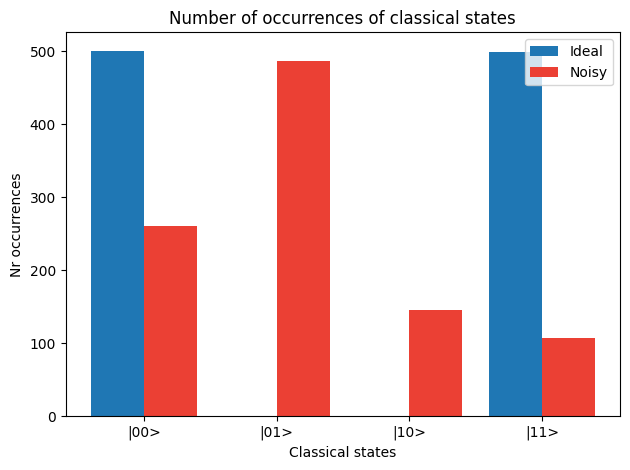

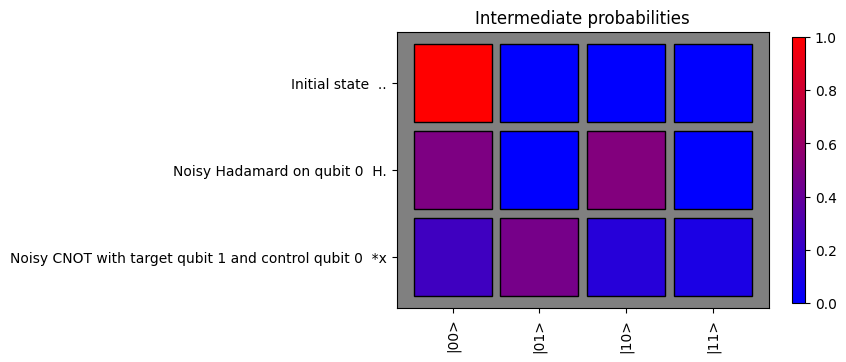

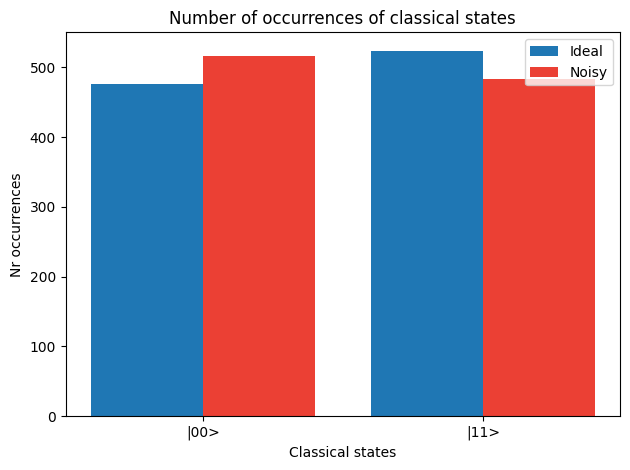

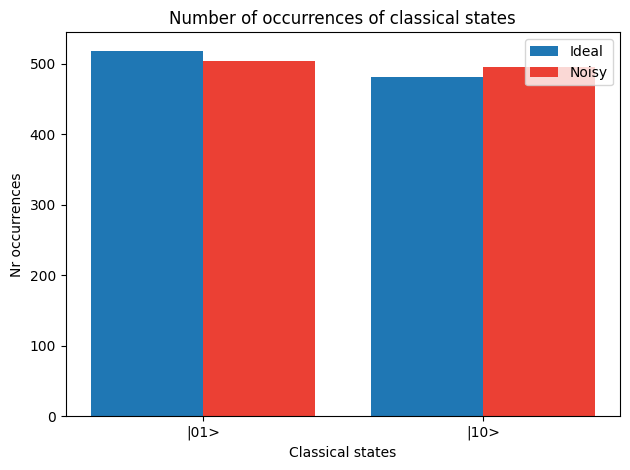

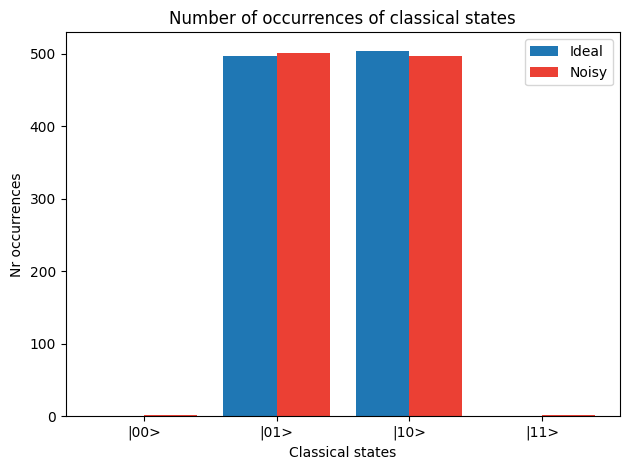

In [47]:
noisy_circ_bell_phi_plus = NoisyCircuit(2)
noisy_circ_bell_phi_plus.noisy_hadamard(0)
noisy_circ_bell_phi_plus.noisy_cnot(0,1)

noisy_circ_bell_phi_minus = NoisyCircuit(2)
noisy_circ_bell_phi_minus.noisy_pauli_x(0)
noisy_circ_bell_phi_minus.noisy_hadamard(0)
noisy_circ_bell_phi_minus.cnot(0,1)

noisy_circ_bell_psi_plus = NoisyCircuit(2)
noisy_circ_bell_psi_plus.noisy_pauli_x(1)
noisy_circ_bell_psi_plus.noisy_hadamard(0)
noisy_circ_bell_psi_plus.cnot(0,1)

noisy_circ_bell_psi_minus = NoisyCircuit(2)
noisy_circ_bell_psi_minus.noisy_hadamard(0)
noisy_circ_bell_psi_minus.noisy_pauli_x(1)
noisy_circ_bell_psi_minus.noisy_pauli_z(0)
noisy_circ_bell_psi_minus.noisy_pauli_z(1)
noisy_circ_bell_psi_minus.cnot(0,1)

circ_bell_phi_plus = Circuit(2)
circ_bell_phi_plus.hadamard(0)
circ_bell_phi_plus.cnot(0,1)

circ_bell_phi_minus = Circuit(2)
circ_bell_phi_minus.pauli_x(0)
circ_bell_phi_minus.hadamard(0)
circ_bell_phi_minus.cnot(0,1)

circ_bell_psi_plus = Circuit(2)
circ_bell_psi_plus.pauli_x(1)
circ_bell_psi_plus.hadamard(0)
circ_bell_psi_plus.cnot(0,1)

circ_bell_psi_minus = Circuit(2)
circ_bell_psi_minus.hadamard(0)
circ_bell_psi_minus.pauli_x(1)
circ_bell_psi_minus.pauli_z(0)
circ_bell_psi_minus.pauli_z(1)
circ_bell_psi_minus.cnot(0,1)

result_bell_phi_plus = QuantumUtil.run_circuit(circ_bell_phi_plus)
noisy_result_bell_phi_plus = QuantumUtil.run_circuit(noisy_circ_bell_phi_plus)
QuantumUtil.histogram_of_classical_states(result_bell_phi_plus, noisy_result_bell_phi_plus)
QuantumUtil.show_all_probabilities(noisy_circ_bell_phi_plus)
result_bell_phi_minus = QuantumUtil.run_circuit(circ_bell_phi_minus)
noisy_result_bell_phi_minus = QuantumUtil.run_circuit(noisy_circ_bell_phi_minus)
QuantumUtil.histogram_of_classical_states(result_bell_phi_minus, noisy_result_bell_phi_minus)
result_bell_psi_plus = QuantumUtil.run_circuit(circ_bell_psi_plus)
noisy_result_bell_psi_plus = QuantumUtil.run_circuit(noisy_circ_bell_psi_plus)
QuantumUtil.histogram_of_classical_states(result_bell_psi_plus, noisy_result_bell_psi_plus)
result_bell_psi_minus = QuantumUtil.run_circuit(circ_bell_psi_minus)
noisy_result_bell_psi_minus = QuantumUtil.run_circuit(noisy_circ_bell_psi_minus)
QuantumUtil.histogram_of_classical_states(result_bell_psi_minus, noisy_result_bell_psi_minus)

# 120 Chained Pauli X gates - Ideal vs Noisy

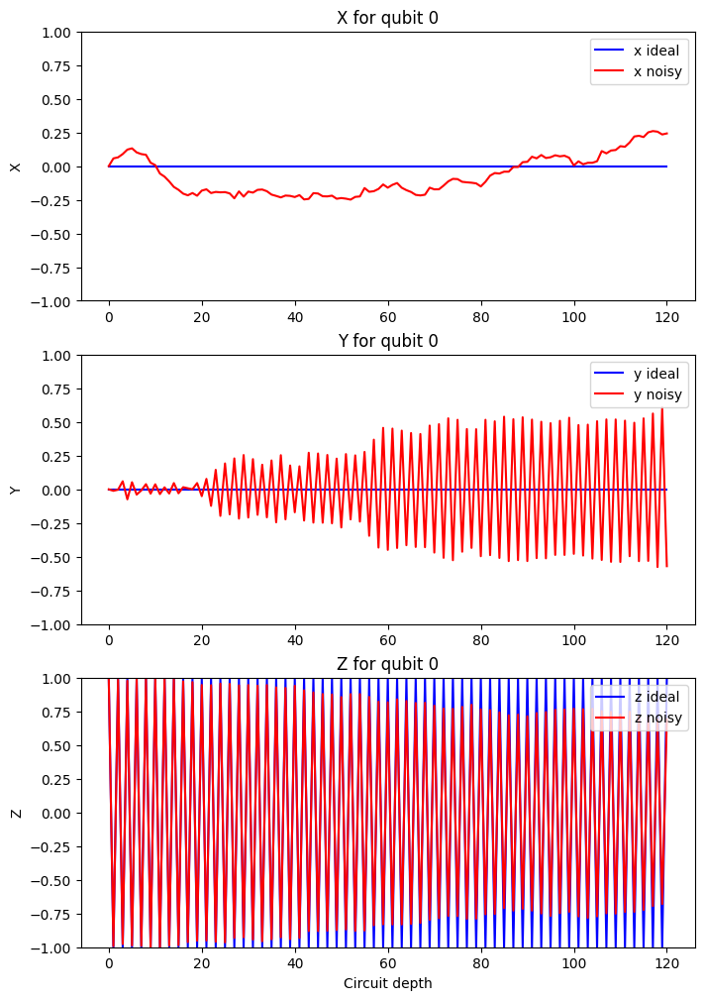

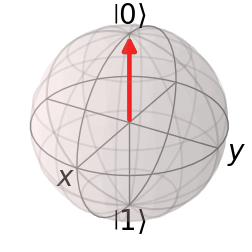

In [8]:
circuit = NoisyCircuit(1)
noisy_circuit = NoisyCircuit(1)
for i in range(120):
    circuit.pauli_x(0)
    noisy_circuit.noisy_pauli_x(0)

result = QuantumUtil.run_circuit(circuit)
noisy_result = QuantumUtil.run_circuit(noisy_circuit)
QuantumUtil.plot_intermediate_states_per_qubit(circuit, noisy_circuit)

# Create animation
ani = QuantumUtil.create_animation(circuit, noisy_circuit)

# Display the animation in the Jupyter notebook
HTML(ani.to_jshtml())
